In [3]:
5

5

In [4]:
%load_ext autoreload
%autoreload 2
5

5

In [5]:
from pathlib import Path
HOME_DIR = Path('/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond')
WEIGHTS_DIR = Path('/home/dcor/alonwolf/autoregressive/Infinity') / 'weights'
import sys, os
sys.path.append(str(HOME_DIR.resolve()))
from huggingface_hub import snapshot_download
snapshot_download(repo_id="FoundationVision/Infinity", local_dir=WEIGHTS_DIR)

Fetching 26 files:   0%|          | 0/26 [00:00<?, ?it/s]

'/home/dcor/alonwolf/autoregressive/Infinity/weights'

In [6]:
# log in to huggingface

import os
from huggingface_hub import login
login(os.getenv('HUGGINGFACE_TOKEN', None))

In [7]:
import argparse
import random
import torch
torch.cuda.set_device(0)
import cv2
import numpy as np
from tools.run_infinity import *

import random
import torch
torch.cuda.set_device(0)
import cv2
import numpy as np
from tools.run_infinity import *
import os

model_path=str((WEIGHTS_DIR/'infinity_2b_reg.pth').resolve())
vae_path=str((WEIGHTS_DIR/'infinity_vae_d32reg.pth').resolve())
text_encoder_ckpt = 'google/flan-t5-xl'
args=argparse.Namespace(
    pn='1M',
    model_path=model_path,
    cfg_insertion_layer=0,
    vae_type=32,
    vae_path=vae_path,
    add_lvl_embeding_only_first_block=1,
    use_bit_label=1,
    model_type='infinity_2b',
    rope2d_each_sa_layer=1,
    rope2d_normalized_by_hw=2,
    use_scale_schedule_embedding=0,
    sampling_per_bits=1,
    text_encoder_ckpt=text_encoder_ckpt,
    text_channels=2048,
    apply_spatial_patchify=0,
    h_div_w_template=1.000,
    use_flex_attn=0,
    cache_dir='/dev/shm',
    checkpoint_type='torch',
    seed=0,
    bf16=1,
    save_file='tmp.jpg',
    hf_token=os.getenv('HUGGINGFACE_TOKEN', None),
)

In [8]:
os.path.exists(args.vae_path), os.path.exists(args.model_path)


(True, True)

In [9]:
str(args.vae_path)


'/home/dcor/alonwolf/autoregressive/Infinity/weights/infinity_vae_d32reg.pth'

In [10]:
# load text encoder
text_tokenizer, text_encoder = load_tokenizer(t5_path=args.text_encoder_ckpt, hf_token=args.hf_token)

[Loading tokenizer and text encoder]


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [11]:
# load vae
vae = load_visual_tokenizer(args)

In [12]:
args.enable_model_cache = False

In [13]:
# load infinity
infinity = load_transformer(vae, args)

load checkpoint from /home/dcor/alonwolf/autoregressive/Infinity/weights/infinity_2b_reg.pth
[Loading Infinity]
self.codebook_dim: 32, self.add_lvl_embeding_only_first_block: 1,             self.use_bit_label: 1, self.rope2d_each_sa_layer: 1, self.rope2d_normalized_by_hw: 2


/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond/tools/run_infinity.py:250: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True, dtype=torch.bfloat16, cache_enabled=True), torch.no_grad():


self.num_blocks_in_a_chunk=4, depth=32, block_chunks=8

[constructor]  ==== customized_flash_attn=False (using_flash=0/32), fused_mlp=False (fused_mlp=0/32) ==== 
    [Infinity config ] embed_dim=2048, num_heads=16, depth=32, mlp_ratio=4, swiglu=False num_blocks_in_a_chunk=4
    [drop ratios] drop_rate=0.0, drop_path_rate=0.1 (tensor([0.0000, 0.0032, 0.0065, 0.0097, 0.0129, 0.0161, 0.0194, 0.0226, 0.0258,
        0.0290, 0.0323, 0.0355, 0.0387, 0.0419, 0.0452, 0.0484, 0.0516, 0.0548,
        0.0581, 0.0613, 0.0645, 0.0677, 0.0710, 0.0742, 0.0774, 0.0806, 0.0839,
        0.0871, 0.0903, 0.0935, 0.0968, 0.1000]))

[you selected Infinity with model_kwargs={'depth': 32, 'embed_dim': 2048, 'num_heads': 16, 'drop_path_rate': 0.1, 'mlp_ratio': 4, 'block_chunks': 8}] model size: 2.20B, bf16=1
[you selected Infinity with model_kwargs={'depth': 32, 'embed_dim': 2048, 'num_heads': 16, 'drop_path_rate': 0.1, 'mlp_ratio': 4, 'block_chunks': 8}] model size: 2.20B, bf16=1
[Load Infinity weights]
[Loa

/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond/tools/run_infinity.py:283: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_path, map_locat

<All keys matched successfully>


In [19]:
prompt = """a cat striding on a skateboard"""
cfg = 3
tau = 0.5
h_div_w = 1/1 # aspect ratio, height:width
seed = random.randint(0, 10000)
enable_positive_prompt=0

h_div_w_template_ = h_div_w_templates[np.argmin(np.abs(h_div_w_templates-h_div_w))]
scale_schedule = dynamic_resolution_h_w[h_div_w_template_][args.pn]['scales']
scale_schedule = [(1, h, w) for (_, h, w) in scale_schedule]
generated_image = gen_one_img(
    infinity,
    vae,
    text_tokenizer,
    text_encoder,
    prompt,
    g_seed=seed,
    gt_leak=0,
    gt_ls_Bl=None,
    cfg_list=cfg,
    tau_list=tau,
    scale_schedule=scale_schedule,
    cfg_insertion_layer=[args.cfg_insertion_layer],
    vae_type=args.vae_type,
    sampling_per_bits=args.sampling_per_bits,
    enable_positive_prompt=enable_positive_prompt,
)
# args.save_file = 'ipynb_tmp.jpg'
# os.makedirs(osp.dirname(osp.abspath(args.save_file)), exist_ok=True)
# cv2.imwrite(args.save_file, generated_image.cpu().numpy())
# print(f'Save to {osp.abspath(args.save_file)}')

prompt=a cat striding on a skateboard
cfg: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], tau: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
cfg: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], tau: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])


/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond/tools/run_infinity.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True, dtype=torch.bfloat16, cache_enabled=True):
/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond/infinity/models/basic.py:495: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):    # disable half precision


summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
cost: 8.745755910873413, infinity cost=8.431877136230469
cost: 8.745755910873413, 

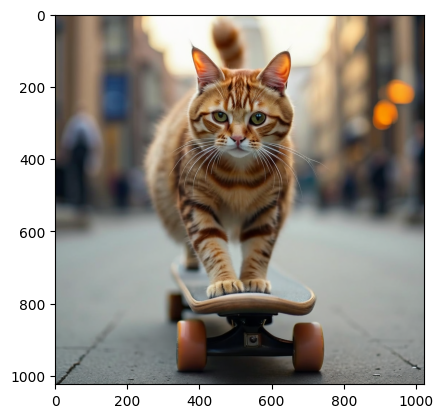

In [20]:
import matplotlib.pyplot as plt
plt.imshow(generated_image.cpu().numpy()[:,:,::-1])

In [22]:
def get_tokens(prompt):
    tokens = text_tokenizer(prompt)
    return text_tokenizer.convert_ids_to_tokens(tokens['input_ids'])

## Editing prompt mid

In [32]:
prompt = """a cat striding on a skateboard"""
edit_prompt = prompt.replace('skateboard', 'hoverboard')
cfg = 3
tau = 0.5
h_div_w = 1/1 # aspect ratio, height:width
seed = random.randint(0, 10000)
enable_positive_prompt=0

h_div_w_template_ = h_div_w_templates[np.argmin(np.abs(h_div_w_templates-h_div_w))]
scale_schedule = dynamic_resolution_h_w[h_div_w_template_][args.pn]['scales']
scale_schedule = [(1, h, w) for (_, h, w) in scale_schedule]

ret, idx_Bld_list, original_image, list_summed_codes = gen_one_img_2(
    infinity,
    vae,
    text_tokenizer,
    text_encoder,
    prompt,
    g_seed=seed,
    gt_leak=0,
    gt_ls_Bl=None,
    cfg_list=cfg,
    tau_list=tau,
    scale_schedule=scale_schedule,
    cfg_insertion_layer=[args.cfg_insertion_layer],
    vae_type=args.vae_type,
    sampling_per_bits=args.sampling_per_bits,
    enable_positive_prompt=enable_positive_prompt,
    edit=False,
    edit_prompt=edit_prompt,
    edit__si=0,
)

edit_images = {}
for edit__si in [len(scale_schedule) // 3]: #range(0, len(scale_schedule), 3):
    _, _, edit_images[edit__si], _ = gen_one_img_2(
        infinity,
        vae,
        text_tokenizer,
        text_encoder,
        prompt,
        g_seed=seed,
        gt_leak=0,
        gt_ls_Bl=None,
        cfg_list=cfg,
        tau_list=tau,
        scale_schedule=scale_schedule,
        cfg_insertion_layer=[args.cfg_insertion_layer],
        vae_type=args.vae_type,
        sampling_per_bits=args.sampling_per_bits,
        enable_positive_prompt=enable_positive_prompt,
        edit=True,
        edit_prompt=edit_prompt,
        edit__si=edit__si,
    )

prompt=a cat striding on a skateboard
cfg: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], tau: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 1
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 2
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 3


/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond/tools/run_infinity.py:176: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True, dtype=torch.bfloat16, cache_enabled=True):
/home/dcor/alonwolf/autoregressive/ToInfinityAndBeyond/infinity/models/basic.py:495: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):    # disable half precision


summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 4
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 5
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 6
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 7
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 8
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 9
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 10
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 11
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 12
cost: 8.630305528640747, infinity cost=8.329792737960815
prompt=a cat striding on a skateboard
prompt=a cat striding on a hoverboard
cfg: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], tau: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]
EDITING PROMPT
summed_codes shape: torch.Size([1, 32, 1, 64, 64])
idx_Bld_list shape: 1
su

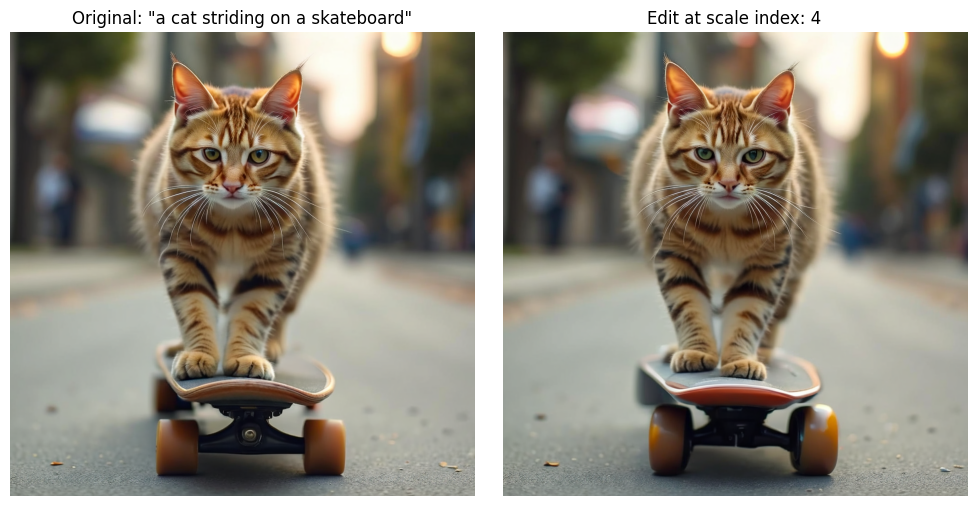

In [34]:
import matplotlib.pyplot as plt

# Calculate the number of images (including original)
num_edit_images = len(edit_images)
total_images = num_edit_images + 1  # +1 for original

if num_edit_images > 0:
    # Create a grid layout - adjust rows and columns as needed
    cols = min(3, total_images)  # Max 3 columns
    rows = (total_images + cols - 1) // cols  # Calculate rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    
    # Handle case where there's only one subplot
    # if total_images == 1:
    #     axes = [axes]
    # elif rows == 1:
    #     axes = axes if isinstance(axes, list) else [axes]
    # else:
    #     axes = axes.flatten()
    
    # Display original image first
    axes[0].imshow(original_image.cpu().numpy()[:,:,::-1])
    axes[0].set_title('Original: "a cat striding on a skateboard"')
    axes[0].axis('off')
    
    # Display each edited image with its key as title
    for i, (key, image) in enumerate(edit_images.items()):
        ax = axes[i + 1]  # +1 to skip the original image position
        ax.imshow(image.cpu().numpy()[:,:,::-1])
        ax.set_title(f'Edit at scale index: {key}')
        ax.axis('off')
    
    # Hide any unused subplots
    for i in range(total_images, len(axes)):
        axes[i].axis('off')
        axes[i].set_visible(False)
    
    plt.tight_layout()
    plt.show()
else:
    print("No images found in edit_images dictionary")

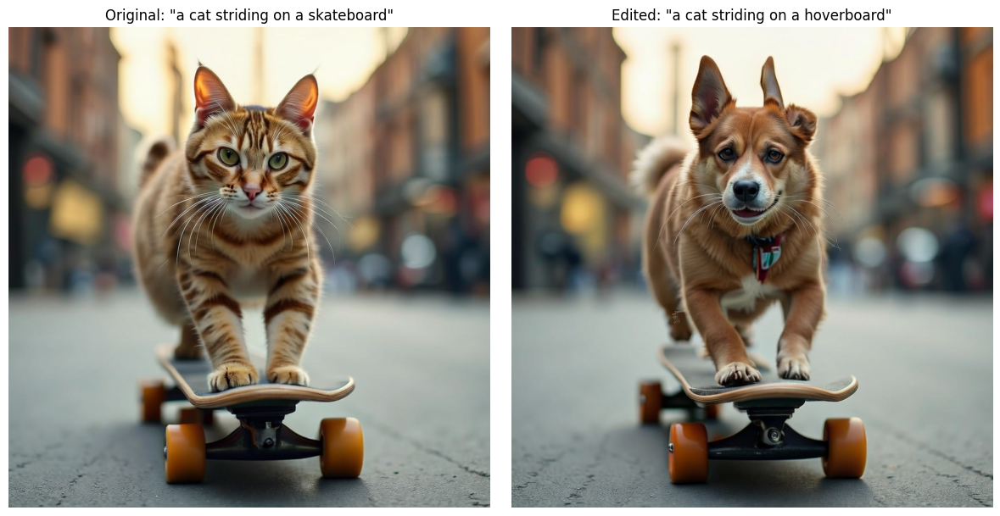

In [26]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Display original image
ax1.imshow(original_image.cpu().numpy()[:,:,::-1])
ax1.set_title('Original: "a cat striding on a skateboard"')
ax1.axis('off')

# Display edited image
ax2.imshow(edit_images.values().__next__().cpu().numpy()[:,:,::-1])
ax2.set_title('Edited: "a cat striding on a hoverboard"')
ax2.axis('off')

plt.tight_layout()
plt.show()

# Inversion and editing

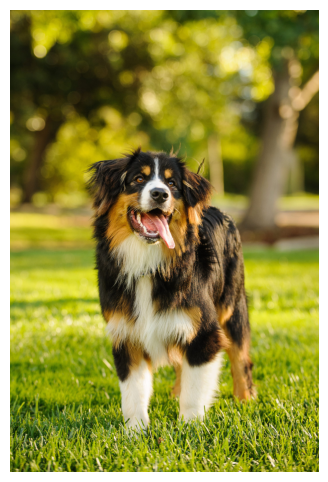

Image size: (2146, 3219)


In [46]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
img_path = HOME_DIR / "images" / "real" / "bern.jpg"
img = Image.open(img_path)

# Display the image
plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')
# plt.title('Loaded Image: good-advice-puppy-toy-1024x684.jpg')
plt.show()

# Print image info
print(f"Image size: {img.size}")

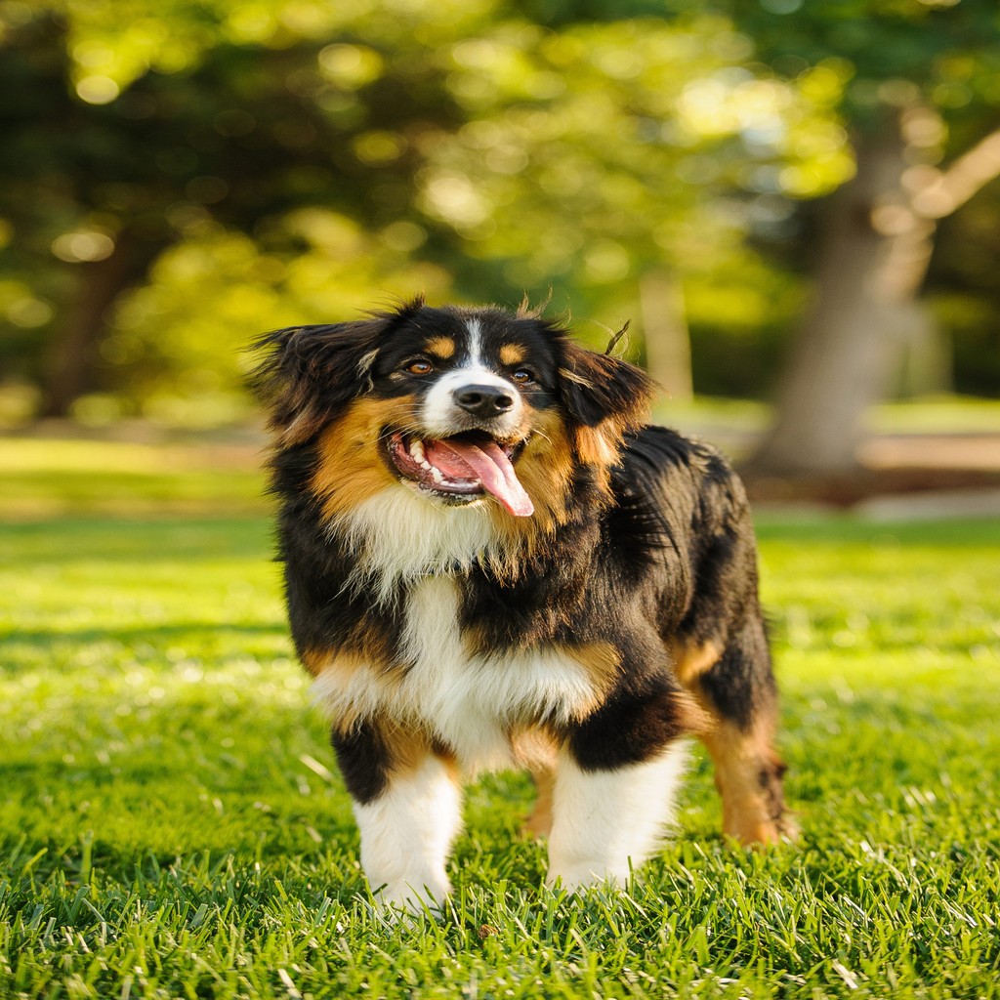

In [48]:
img = img.resize((1024, 1024), Image.LANCZOS)
img

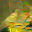

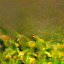

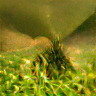

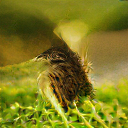

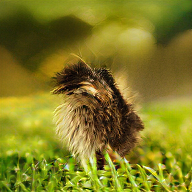

...

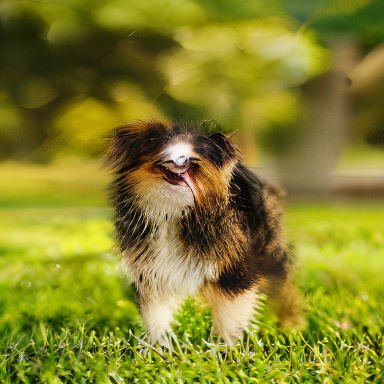

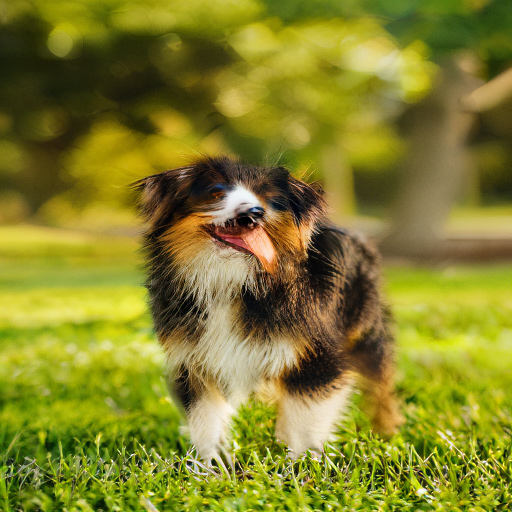

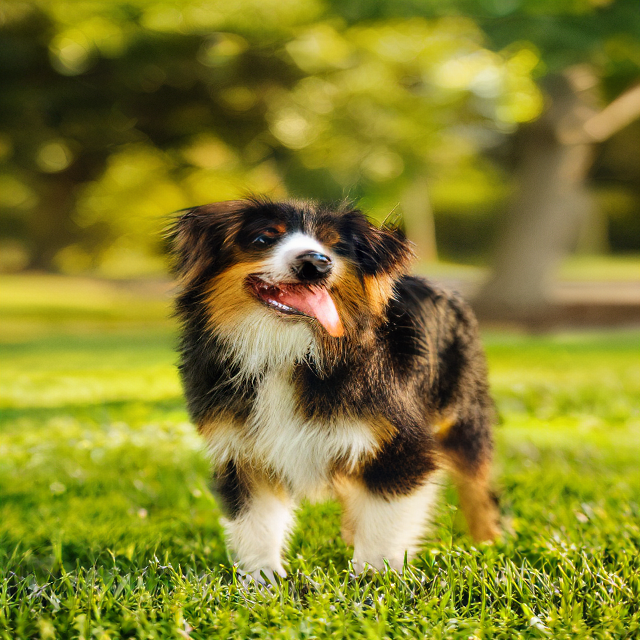

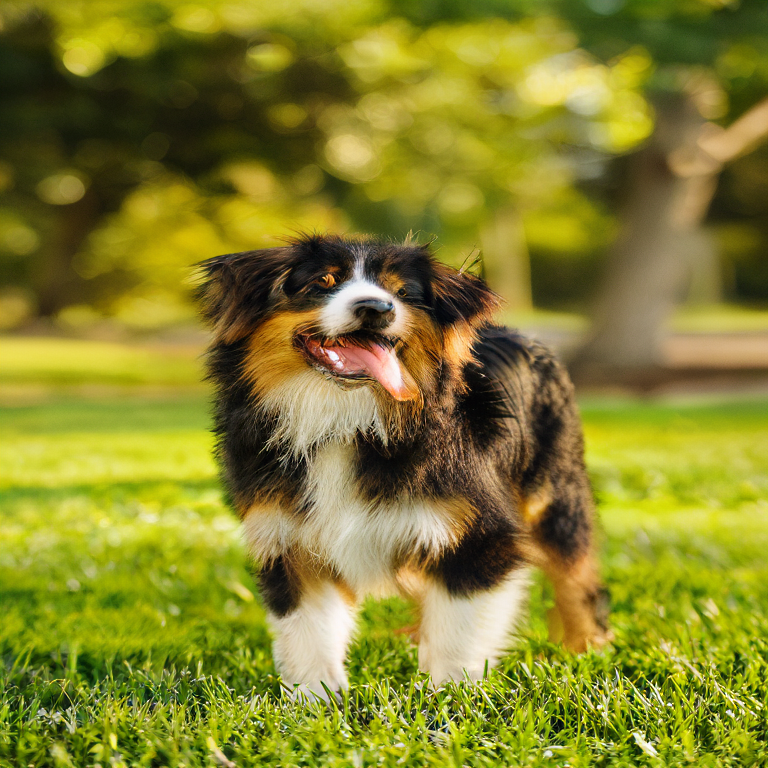

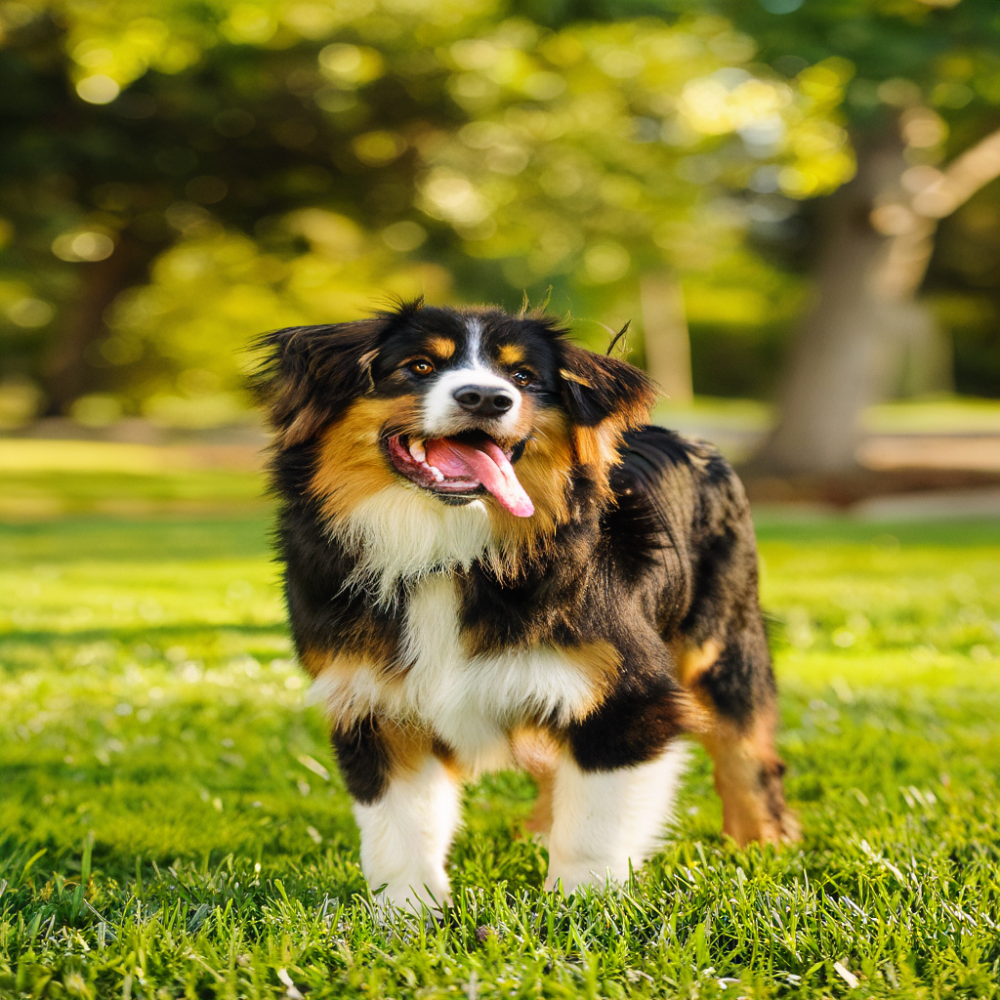

In [49]:
encoded_image = encode_image(img, vae, scale_schedule)
from IPython.display import display
with torch.no_grad():
    for e_img in encoded_image[-1]:
        decoded_img = decode_image(e_img, vae)
        display(decoded_img)

In [ ]:
decoded_img = decode_image(encoded_image[0][-1], vae)


## VAE Games

In [38]:
def encode_image(img, vae, scale_schedule):
    """
    Encodes a PIL image using the VAE.
    
    Args:
        img (PIL.Image): The input image to encode.
        vae: The VAE model.
        scale_schedule: The scale schedule for encoding.
    
    Returns:
        Encoded image tensor.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    with torch.no_grad():
        # Convert PIL image to tensor and normalize
        img_tensor = torch.from_numpy(np.array(img).astype(np.float32) / 255.0).unsqueeze(0).permute(0, 3, 1, 2).to(device)
        img_tensor = 2 * img_tensor - 1.
        # Encode the image using the VAE
        encoded_img = vae.encode(img_tensor, scale_schedule)
    return encoded_img

def decode_image(encoded_img, vae):
    """
    Decodes an encoded image tensor using the VAE.
    
    Args:
        encoded_img: The encoded image tensor.
        vae: The VAE model.
    
    Returns:
        Decoded image tensor.
    """
    if encoded_img.dim() == 5:
        encoded_img = encoded_img.squeeze(2)

    # e_img = torch.flip(e_img, [2]) # Flip the image horizontally
    
    with torch.no_grad():
        # Decode the image using the VAE
        decoded_img = vae.decode(encoded_img)
        decoded_img = (decoded_img + 1) / 2
        decoded_img = decoded_img.permute(0, 2, 3, 1).mul_(255).to(torch.uint8).squeeze(0)
        decoded_img = decoded_img.cpu().numpy()
        decoded_img = Image.fromarray(decoded_img)
    return decoded_img

In [ ]:
from IPython.display import display
with torch.no_grad():
    for e_img in encoded_img[-1]:
        decoded_img = decode_image(e_img, vae)
        display(decoded_img)

In [ ]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Display original image
ax1.imshow(original_image.cpu().numpy()[:,:,::-1])
ax1.set_title('Original: "a cat striding on a skateboard"')
ax1.axis('off')

# Display edited image
ax2.imshow(edit_image.cpu().numpy()[:,:,::-1])
ax2.set_title('Edited: "a cat striding on a hoverboard"')
ax2.axis('off')

plt.tight_layout()
plt.show()